# Cell type labeling of scRNA-seq data from Parkinson's disease studies

## Description

* This notebook covers functions to assing cell type labels to unsupervised clusters from two studies [Agarwal_2020](https://pubmed.ncbi.nlm.nih.gov/32826893/) and [Kamath_2022](https://pubmed.ncbi.nlm.nih.gov/35513515/).     
* Original author markers are used to label unsupervised clusters after Harmony batch correction and then contrasted vs. original author labels.
* Requires the `adata_after_harmony.h5ad` file produced by script `02_integration.ipynb`.

In [1]:
### External modules
import warnings
import os
import scanpy as sc
import scanpy.external as sce
import pandas as pd
import logging
import sys
import plotly.express as px
import seaborn as sns
import numpy as np
import matplotlib as plt
import dash_bio

import io
import requests

### Logs and warning settings
warnings.filterwarnings("ignore")
logging.basicConfig(level=logging.INFO, format="%(asctime)s %(name)s %(levelname)s:\n%(message)s")
logger = logging.getLogger(__name__)

## Define inputs/outputs.

In [2]:
### base indir h5ad files
in_h5ad = os.path.expanduser('~/sc_and_spatial_parkinson/data/adata')
in_data = os.path.expanduser('~/sc_and_spatial_parkinson/data')

## Load h5ad adata

In [3]:
adata = sc.read_h5ad(os.path.join(in_h5ad, "adata_after_harmony.h5ad"))
logger.info((f"Concatenated: {adata}"))

2025-06-24 19:10:48,145 __main__ INFO:
Concatenated: AnnData object with n_obs × n_vars = 120955 × 27960
    obs: 'barcode', 'study_name', 'sample_name', 'sample_source', 'sample_organism', 'sample_tissue_region', 'donor_gender', 'donor_age_years', 'cause_of_death', 'authors_main_cell_type', 'authors_sub_cell_type', 'Nurr_status', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'doublet_score', 'predicted_doublet', 'study_name_abv', 'umap_no_batch_corr_1', 'umap_no_batch_corr_2', 'leiden_no_batch_corr', 'umap_harmony_1', 'umap_harmony_2', 'leiden_harmony'
    var: 'gene-0', 'gene-1', 'feature_is_filtered-1', 'feature_name-1', 'feature_reference-1', 'feature_biotype-1', 'feature_leng

#### Make an `obs.gene_name` index to use gene names directly (instead looking up ENSG codes)

In [4]:
adata.var['ENSG'] = adata.var.index
adata.var['gene_name'] = np.where(adata.var['gene-0'] == adata.var['gene-1'], adata.var['gene-0'], adata.var['gene-0'].astype(str) + '_' + adata.var['gene-1'].astype(str))
adata.var['gene_name'] = adata.var['gene_name'].replace(r'_ENSG.+', '', regex=True)
adata.var.set_index('gene_name', inplace=True, drop=False)

In [14]:
pd.set_option('display.max_rows', 90)
adata.obs[['study_name_abv','authors_main_cell_type','authors_sub_cell_type']].value_counts().sort_index()

study_name_abv  authors_main_cell_type  authors_sub_cell_type
Agarwal_2020    Astrocyte               Astrocyte                 398
                Astrocytes              Astrocytes-1              525
                                        Astrocytes-2              113
                DaN                     DaNs                       72
                Endothelial             Endothelial                74
                                                                 ... 
Kamath_2022     Oligodendrocytes        Olig_ENPP6_LUCAT1        4235
                                        Olig_PLXDC2              3057
                                        Olig_PLXDC2_KCNAB1       2944
                                        Olig_PLXDC2_KCNK10        370
                                        Olig_PLXDC2_SFRP1        6533
Name: count, Length: 100, dtype: int64

## Visualize unsupervised clusters and original author cell type annotations
* Use plotly to visualize cell groups behind each other. For example, clusters 5 and 6 from the no-batch corrected output, overlap in the Harmony-derived UMAP. 

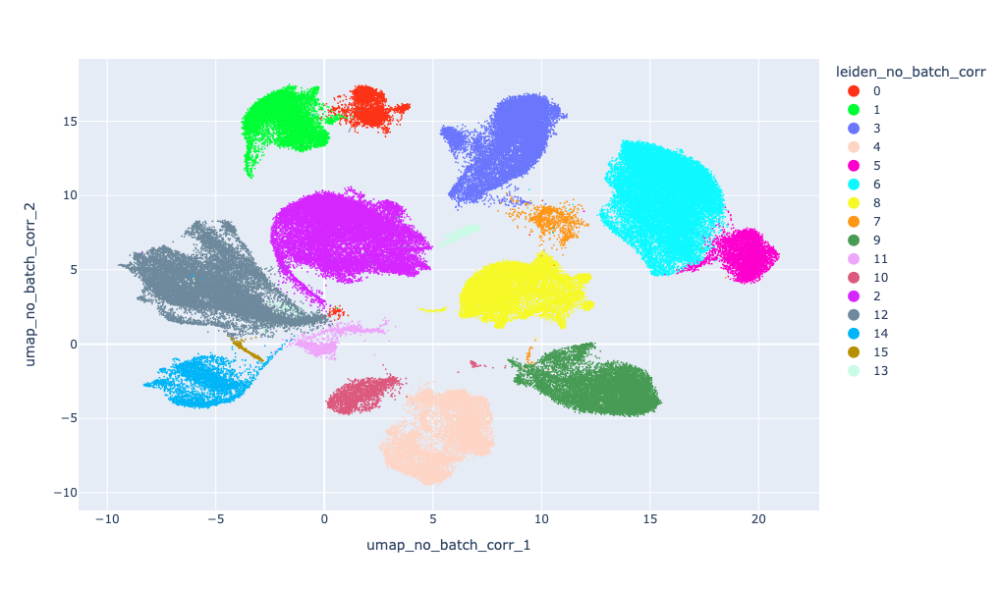

In [23]:
# UMAP from: i) no-batch corrected UMAP calculation and ii) no-batch corrected leiden clusters
fig = px.scatter(
    adata.obs, x="umap_no_batch_corr_1", y="umap_no_batch_corr_2",
    color='leiden_no_batch_corr',
    width=800, height=600,
    color_discrete_sequence=px.colors.qualitative.Light24
)
fig.update_traces(marker=dict(size=2))
fig.update_layout(legend= {'itemsizing': 'constant'})
fig.show()

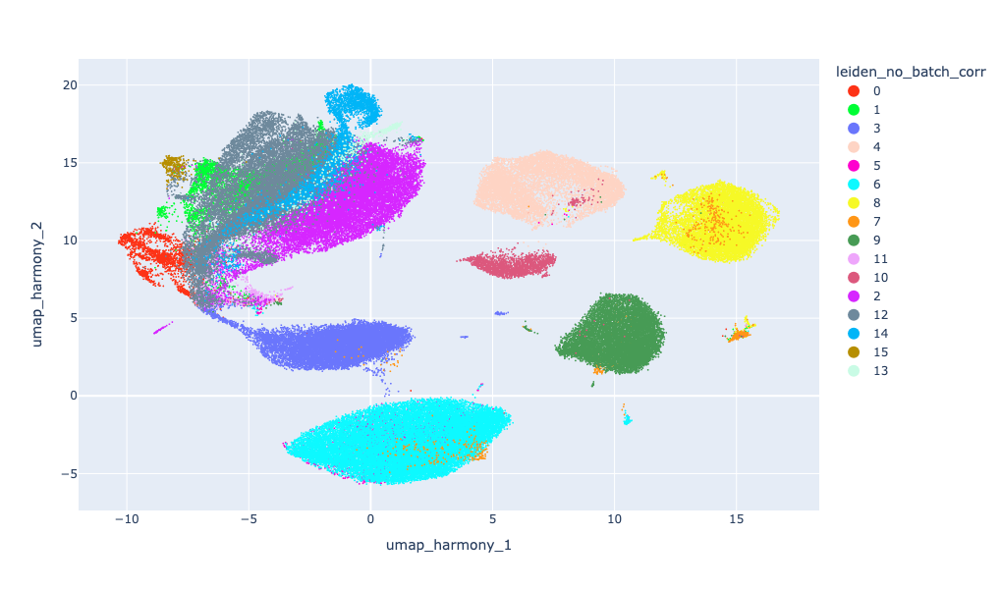

In [24]:
# UMAP from: i) Harmony batch corrected UMAP calculation and ii) no-batch corrected leiden clusters
fig = px.scatter(
    adata.obs, x="umap_harmony_1", y="umap_harmony_2",
    color='leiden_no_batch_corr',
    width=800, height=600,
    color_discrete_sequence=px.colors.qualitative.Light24
)
fig.update_traces(marker=dict(size=2))
fig.update_layout(legend= {'itemsizing': 'constant'})
fig.show()

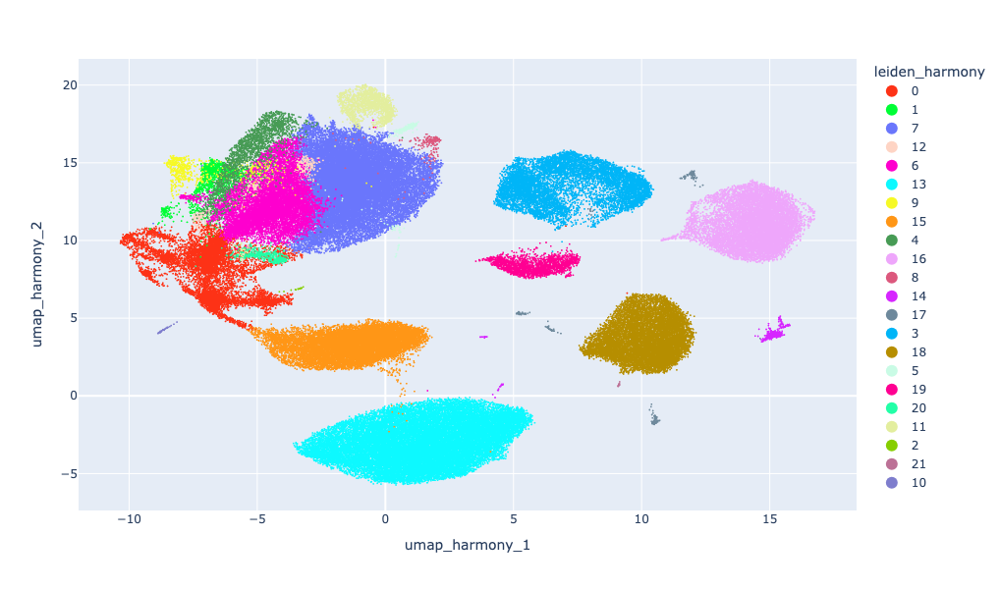

In [17]:
# UMAP from: i) Harmony batch corrected UMAP calculation and ii) Harmony batch corrected leiden clusters
fig = px.scatter(
    adata.obs, x="umap_harmony_1", y="umap_harmony_2",
    color='leiden_harmony',
    width=800, height=600,
    color_discrete_sequence=px.colors.qualitative.Light24
)
fig.update_traces(marker=dict(size=2))
fig.update_layout(legend= {'itemsizing': 'constant'})
fig.show()

## Map original author cell type annotations vs. Harmony unsupervised clusters

In [98]:
leiden_v_ct = pd.crosstab(adata.obs['leiden_harmony'], adata.obs['authors_main_cell_type'])
leiden_v_ct_f = (leiden_v_ct.T/leiden_v_ct.sum(axis=1)).T
leiden_pop = list(zip(list(leiden_pop.keys()), list(leiden_pop.values())))

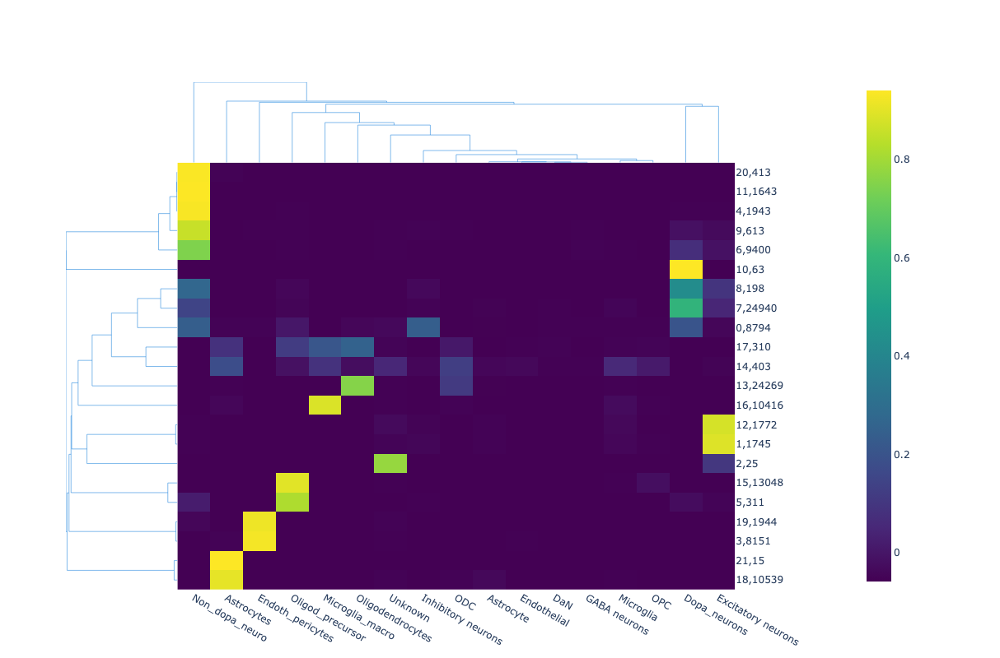

In [101]:
dash_bio.Clustergram(
    data=leiden_v_ct_f,
    column_labels=list(leiden_v_ct_f.columns.values),
    row_labels=leiden_pop,
    height=800,
    width=700,
    color_map='viridis',
)

## Manual annotation of clusters
* In general, labeling matched original author annotations from Agarwal (2020) and Kamath (2022).
* Non-neuron clusters were well defined and relatively easy to label.
* Various neuron clusters (4, 6, 9, 10, 11, 20) were well defined and relatively easy to label.
* Clusters 0, 7 and 8 are are neurons that need deeper analysis to assign subtypes. At this stage they match both dopa and non-dopa markers/labels

In [192]:
"GAD2"
# GABRA1
# GABRB2

True

In [249]:
## Markers from the Kamath et al 2022 (Fig. S1) + NR4A2
marker_genes_dic = {
    'NR4A2': 'Dopa neuron',
    'SLC18A2': 'Dopa neuron',
    'SLC6A3': 'Dopa neuron',
    'TH': 'Dopa neuron',
    'RBFOX3': 'All neurons',
    'AQP4': 'Astrocytes',
    'CX3CR1': 'Microglia / macroph.',
    'VCAN': 'Oligod. precursor',
    'OLIG1': 'Oligod. precursor',
    'CLDN5': 'Endoth / pericytes',
}

marker_genes_neu_dic = {
    'NR4A2': 'Dopa neuron',
    'SLC18A2': 'Dopa neuron',
    'SLC6A3': 'Dopa neuron',
    'TH': 'Dopa neuron',
    'RBFOX3': 'All neurons',
    'GAD1': 'Gaba neurons',
    'GAD2': 'Gaba neurons',
}

# neuron_clusters = ['0','1','4','6','7','8','9','10','11','12','20']

## Manual annotation of clusters
leiden_manual_labels_dic = {
    '20': 'Neurons',
    '11': 'Neurons',
    '4':  'Neurons',
    '9':  'Neurons',
    '6':  'Neurons',
    '10': 'Neurons',
    '8':  'Neurons',
    '7':  'Neurons',
    '0':  'Neurons',
    '12': 'Neurons',
    '1':  'Neurons',
    '13': 'Oligodendrocytes',
    '15': 'Oligod_precursor',
    '5':  'Oligod_precursor',
    '16': 'Microglia_macro',
    '19': 'Endoth_pericytes',
    '3':  'Endoth_pericytes',
    '21': 'Astrocytes',
    '18': 'Astrocytes',
    '2':  'Unknown',
    '17': 'Mix', ## few cells (310)
    '14': 'Mix', ## few cells (403)
}

# Gene reported by Kamath 2022 as transcription factor specific to mammalian midbrain DA neurons
NR4A2_ENSG = "ENSG00000153234"

marker_titles = list(zip(list(marker_genes_dic.keys()), list(marker_genes_dic.values())))
marker_titles_neu = list(zip(list(marker_genes_neu_dic.keys()), list(marker_genes_neu_dic.values())))

### Add new cell type labels to `.obs`

In [250]:
adata.obs['new_cell_type'] = adata.obs.replace({"leiden_harmony": leiden_manual_labels_dic})['leiden_harmony']

### Visualize cell type markers

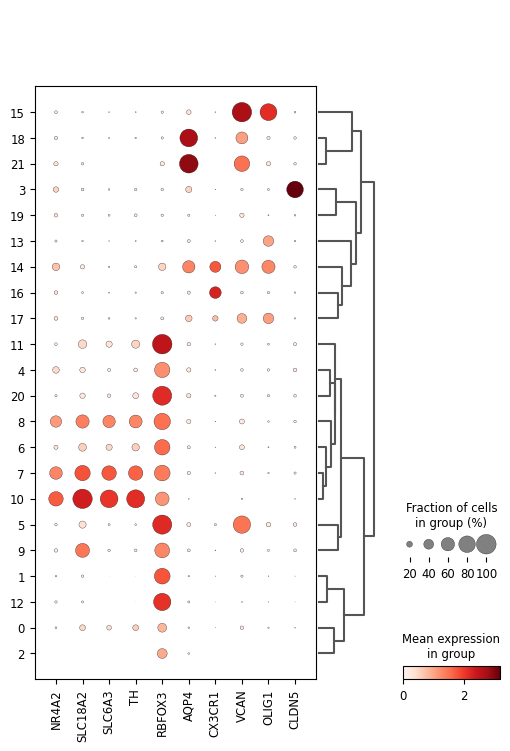

In [119]:
sc.pl.dotplot(adata, list(marker_genes_dic.keys()), groupby='leiden_harmony', dendrogram=True)

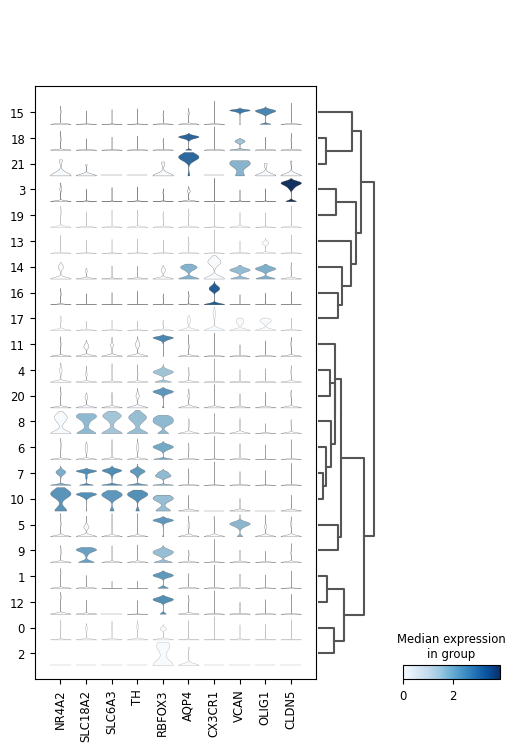

In [120]:
sc.pl.stacked_violin(adata, list(marker_genes_dic.keys()), groupby='leiden_harmony', dendrogram=True)

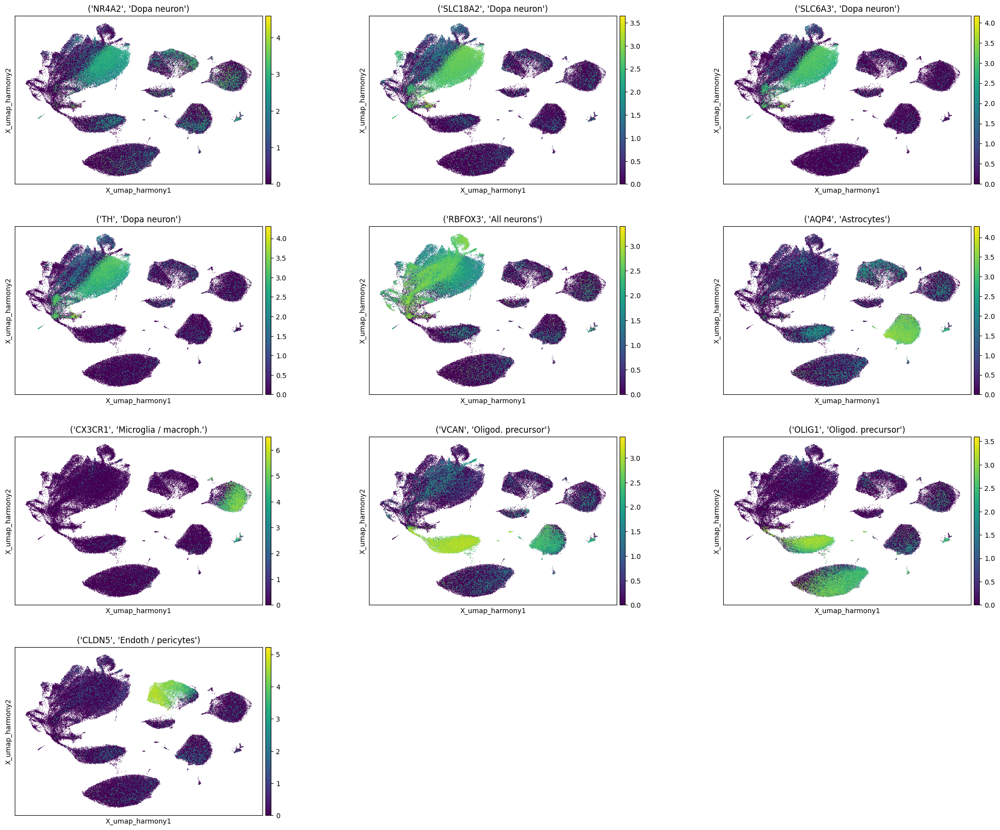

In [121]:
marker_titles = list(zip(list(marker_genes_dic.keys()), list(marker_genes_dic.values())))
plt.rcdefaults()
sc.pl.embedding(adata, basis='X_umap_harmony', color=list(marker_genes_dic.keys()), title=marker_titles,
                size=3, ncols = 3, wspace=0.3)

### Focus on neurons

In [134]:
neuron_clusters = ['0','1','4','6','7','8','9','10','11','12','20']
adata_neu = adata[adata.obs['leiden_harmony'].isin(neuron_clusters)]

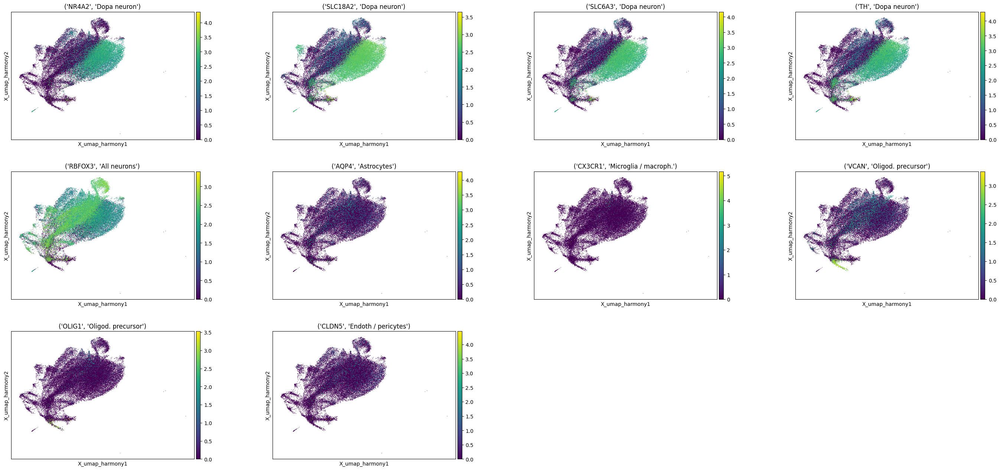

In [254]:
plt.rcdefaults()
sc.pl.embedding(adata_neu, basis='X_umap_harmony', color=list(marker_genes_dic.keys()), title=marker_titles,
                size=3, ncols = 4, wspace=0.3)

### Re-harmonize and cluster neurons

In [255]:
## PCA
sc.pp.pca(adata_neu)

## Harmony
sce.pp.harmony_integrate(adata=adata_neu, key="sample_name")
sc.pp.neighbors(adata_neu, use_rep="X_pca_harmony", key_added="neighbours_sample")
adata_neu.obsm['X_umap_harmony_neu'] = sc.tl.umap(
    adata_neu, neighbors_key="neighbours_sample", copy=True
).obsm['X_umap']
### Add UMAP coordinates to obs for use with Plotly
adata_neu.obs["umap_harmony_neu_1"] = list(pd.DataFrame(adata_neu.obsm["X_umap_harmony_neu"])[0])
adata_neu.obs["umap_harmony_neu_2"] = list(pd.DataFrame(adata_neu.obsm["X_umap_harmony_neu"])[1])

## Clustering
sc.tl.leiden(adata_neu, flavor="igraph", key_added='leiden_harmony_neu', 
             n_iterations=2, resolution=0.3, neighbors_key='neighbours_sample')

KeyboardInterrupt: 

### Visualize new neuron clusters

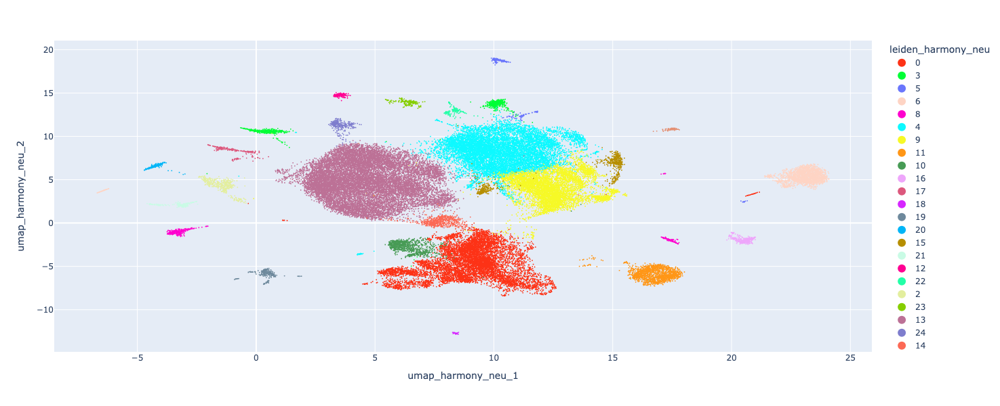

In [203]:
fig = px.scatter(
    adata_neu.obs, x="umap_harmony_neu_1", y="umap_harmony_neu_2",
    color='leiden_harmony_neu',
    width=800, height=600,
    color_discrete_sequence=px.colors.qualitative.Light24
)
fig.update_traces(marker=dict(size=2))
fig.update_layout(legend= {'itemsizing': 'constant'})
fig.show()

### Visualize neuron markers

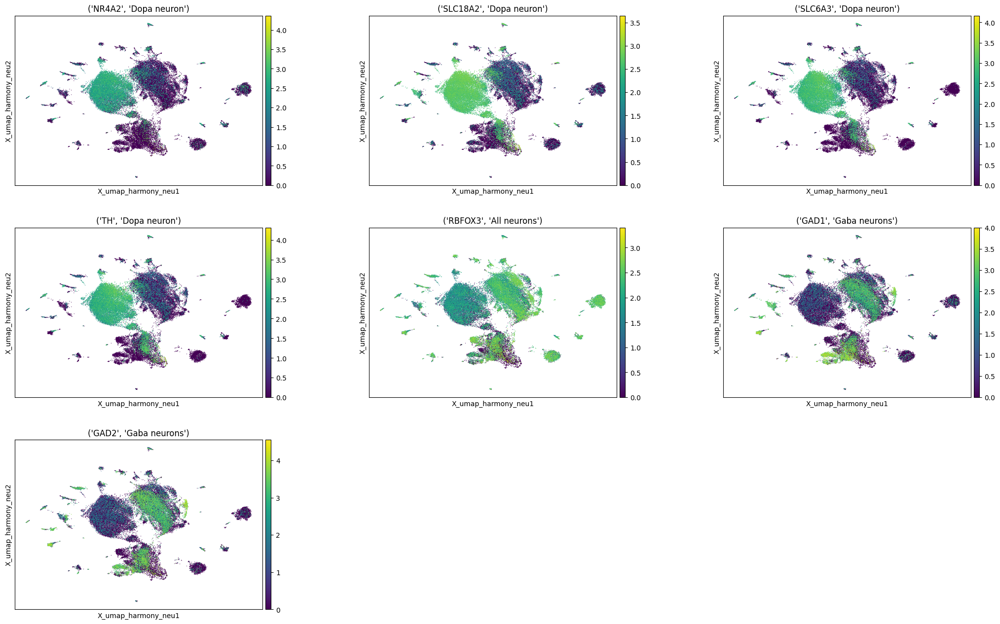

In [204]:
plt.rcdefaults()
sc.pl.embedding(adata_neu, basis='X_umap_harmony_neu', color=list(marker_genes_neu_dic.keys()), title=marker_titles_neu,
                size=3, ncols = 3, wspace=0.3)

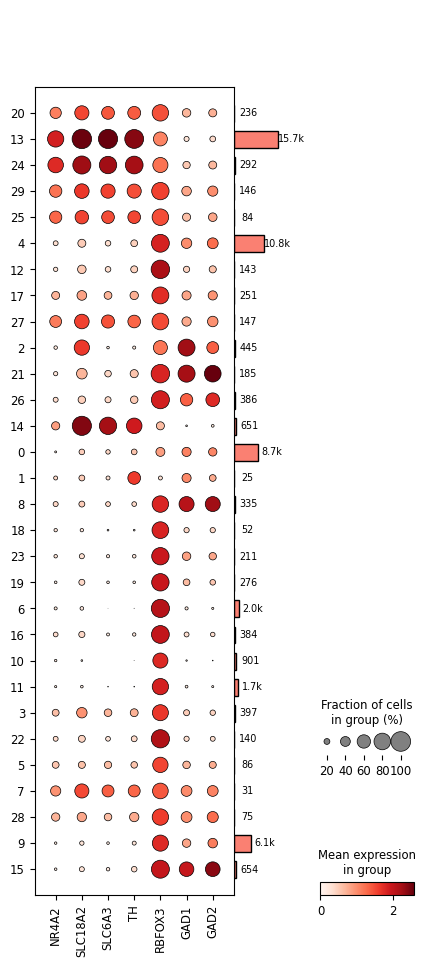

In [207]:
dp = sc.pl.dotplot(adata_neu, list(marker_genes_neu_dic.keys()), 
                   groupby='leiden_harmony_neu', dendrogram=True, return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

### Re-annotate neuron clusters in the full AnnData (with all cell types)

In [ ]:
leiden_neu_manual_labels_dic = {
    '20': 'Dopa_neurons',
    '13': 'Dopa_neurons',
    '24': 'Dopa_neurons',
    '29': 'Dopa_neurons',
    '25': 'Dopa_neurons',
    '4': 'GABA_neurons',
    '12': 'NoDopa_neurons',
    '17': 'Other_neurons',
    '27': 'Other_neurons',
    '2': 'Other_neurons',
    '21': 'GABA_neurons',
    '26': 'GABA_neurons',
    '14': 'Dopa_neurons',
    '0': 'GABA/Dopa_neurons',
    '1': 'Unknown',
    '8': 'GABA_neurons',
    '18': 'NoDopa_neurons',
    '23': 'NoDopa_neurons',
    '19': 'NoDopa_neurons',
    '6': 'NoDopa_neurons',
    '16': 'NoDopa_neurons',
    '10': 'NoDopa_neurons',
    '11': 'NoDopa_neurons',
    '3': 'NoDopa_neurons',
    '22': 'NoDopa_neurons',
    '5': 'NoDopa_neurons',
    '7': 'Other_neurons',
    '28': 'Other_neurons',
    '9': 'GABA_neurons',
    '15': 'GABA_neurons',    
}

In [257]:
adata_neu.obs['new_cell_type_neu'] = adata_neu.obs.replace({"leiden_harmony_neu": leiden_neu_manual_labels_dic})['leiden_harmony_neu']
neu_dic = pd.Series(adata_neu.obs.new_cell_type_neu.values, index=adata_neu.obs.barcode).to_dict()
adata.obs['new_cell_type_final'] = adata.obs['barcode'].map(neu_dic)
adata.obs['new_cell_type_final'] = adata.obs['new_cell_type_final'].fillna(adata.obs['new_cell_type'])

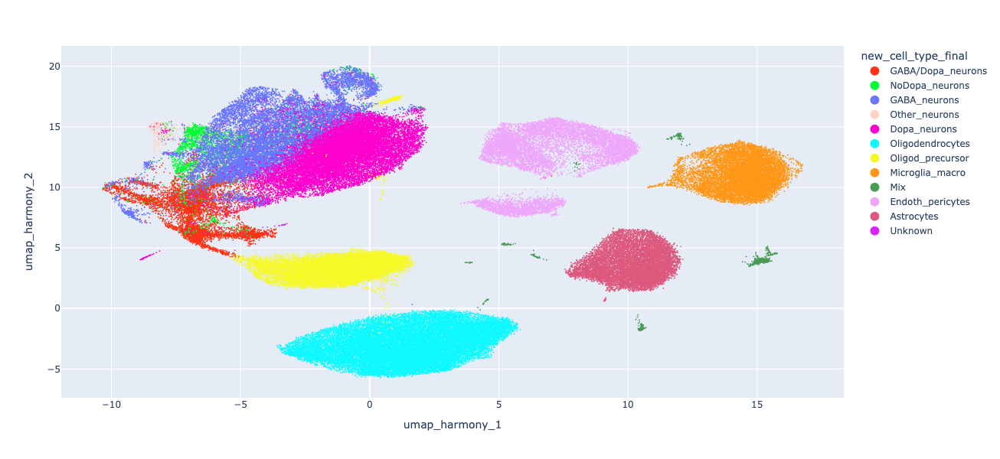

In [258]:
fig = px.scatter(
    adata.obs, x="umap_harmony_1", y="umap_harmony_2",
    color='new_cell_type_final',
    width=800, height=600,
    color_discrete_sequence=px.colors.qualitative.Light24
)
fig.update_traces(marker=dict(size=2))
fig.update_layout(legend= {'itemsizing': 'constant'})
fig.show()

## Save checkpoint

In [259]:
adata.write(os.path.join(in_h5ad, "adata_final_cell_types.h5ad"), compression='gzip')

... storing 'new_cell_type_final' as categorical


## End of script